# FDP - Understanding Depression through XAI
Tamara Pérez Pérez



## Table of contents<a class="anchor" id="index"></a>

### Data Exporation
* [Imports](#imports)
* [Load Dataset](#load)
* [Distribution of Categorical Variables](#dist_cat)
* [Distribution of Numerical Variables](#dist_num)
* [Relationship between Numerical Variables and Depression](#scatterplot)
* [Relationship between Categorical Variables and Depression](#countplot)
* [Correlation Matrix](#matrix)

### Imports<a class="anchor" id="imports"></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

### Load Dataset<a class="anchor" id="load"></a>

In [2]:
df = pd.read_csv('csv/df.csv',index_col=0)

In [3]:
df.head()

,gender,age,race,education_level,marital_status,people_in_the_household,annual_household_income,citizenship_status,total_cholesterol,HDL-cholesterol,...,number_cigarettes_last_month,hours_sleep,trouble_sleeping_history,minutes_sedentary_activity,physical_activity_level,macro_score,mineral_score,vitamin_score,total_nutrient_score,depression_status
SEQN,,,,,,,,,,,,,,,,,,,,,
73557,male,69,black,high_school,separated,3,4,citizen,167.0,65.0,...,0.0,7,Yes,600,sedentary,3,3,2,8,not_depressed
73558,male,54,white,high_school,married,4,7,citizen,170.0,50.0,...,1.0,9,No,540,moderately_active,3,1,1,5,not_depressed
73559,male,72,white,some_college,married,2,10,citizen,126.0,60.0,...,0.0,8,No,300,moderately_active,3,0,3,6,not_depressed
73561,female,73,white,college_graduate,married,2,12,citizen,201.0,85.0,...,0.0,9,No,480,moderately_active,3,0,2,5,not_depressed
73562,male,56,mexican,some_college,divorced,1,9,citizen,226.0,38.0,...,0.0,5,No,360,active,1,0,5,6,depressed


In [4]:
df.columns.tolist()

['gender',
 'age',
 'race',
 'education_level',
 'marital_status',
 'people_in_the_household',
 'annual_household_income',
 'citizenship_status',
 'total_cholesterol',
 'HDL-cholesterol',
 'LDL-cholesterol',
 'triglyceride',
 'lymphocyte_percent',
 'monocyte_percent',
 'neutrophils_percent',
 'eosinophils_percent',
 'basophils_percent',
 'hematocrit_percent',
 'vitamin_B12',
 'albumin',
 'AST',
 'ALT',
 'blood_urea_nitrogen',
 'bicarbonate',
 'total_calcium',
 'CPK',
 'chloride',
 'creatinine',
 'globulin',
 'glucose',
 'gamma_glutamyl_transferase',
 'iron',
 'potassium',
 'lactate_dehydrogenase',
 'sodium',
 'osmolality',
 'phosphorus',
 'total_bilirubin',
 'total_protein',
 'uric_acid',
 'pulse',
 'systolic_blood_pressure',
 'diastoli_blood_pressure',
 'BMI',
 'alcohol_lifetime',
 'binge_drinking_lifetime',
 'number_drinks_last_year',
 'age_started_smoking',
 'smoke_lifetime',
 'number_cigarettes_last_month',
 'hours_sleep',
 'trouble_sleeping_history',
 'minutes_sedentary_activity',

In [4]:
# Categorical variables
cat_num_vars = df[['people_in_the_household','annual_household_income','macro_score','mineral_score', 'vitamin_score', 'total_nutrient_score']]

categorical_vars = df.select_dtypes(include='object')
categorical_vars = pd.concat([categorical_vars, cat_num_vars], axis=1)

# Numerical variables
numerical_vars = df.select_dtypes(exclude='object').drop(columns=cat_num_vars.columns)

print("Categorical Variables:")
print(categorical_vars.columns)

print("\nContinuous Numerical Variables:")
print(numerical_vars.columns)

Categorical Variables:
Index(['gender', 'race', 'education_level', 'marital_status',
       'citizenship_status', 'alcohol_lifetime', 'binge_drinking_lifetime',
       'smoke_lifetime', 'trouble_sleeping_history', 'physical_activity_level',
       'depression_status', 'people_in_the_household',
       'annual_household_income', 'macro_score', 'mineral_score',
       'vitamin_score', 'total_nutrient_score'],
      dtype='object')

Continuous Numerical Variables:
Index(['age', 'total_cholesterol', 'HDL-cholesterol', 'LDL-cholesterol',
       'triglyceride', 'lymphocyte_percent', 'monocyte_percent',
       'neutrophils_percent', 'eosinophils_percent', 'basophils_percent',
       'hematocrit_percent', 'vitamin_B12', 'albumin', 'AST', 'ALT',
       'blood_urea_nitrogen', 'bicarbonate', 'total_calcium', 'CPK',
       'chloride', 'creatinine', 'globulin', 'glucose',
       'gamma_glutamyl_transferase', 'iron', 'potassium',
       'lactate_dehydrogenase', 'sodium', 'osmolality', 'phosphorus',


### Distribution of Categorical Variables<a class="anchor" id="dist_cat"></a>

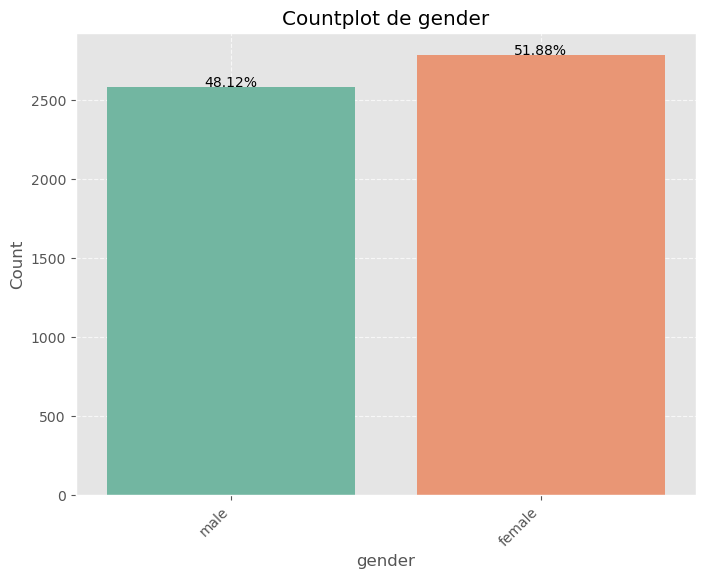

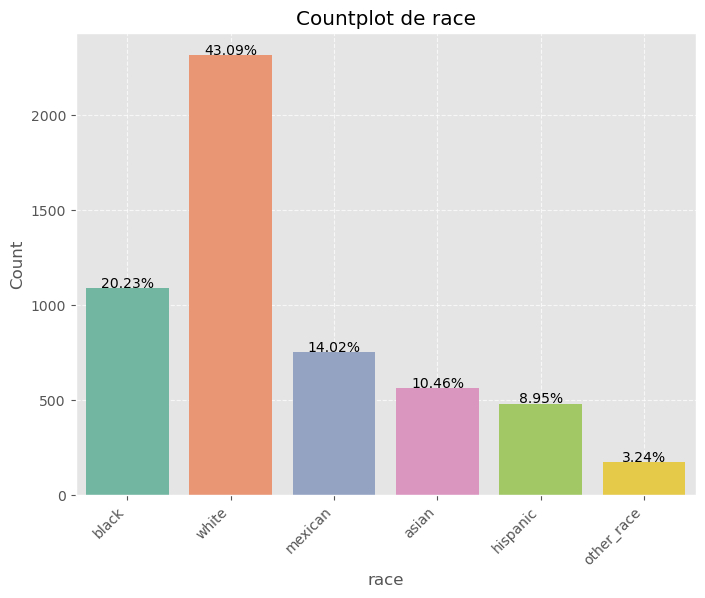

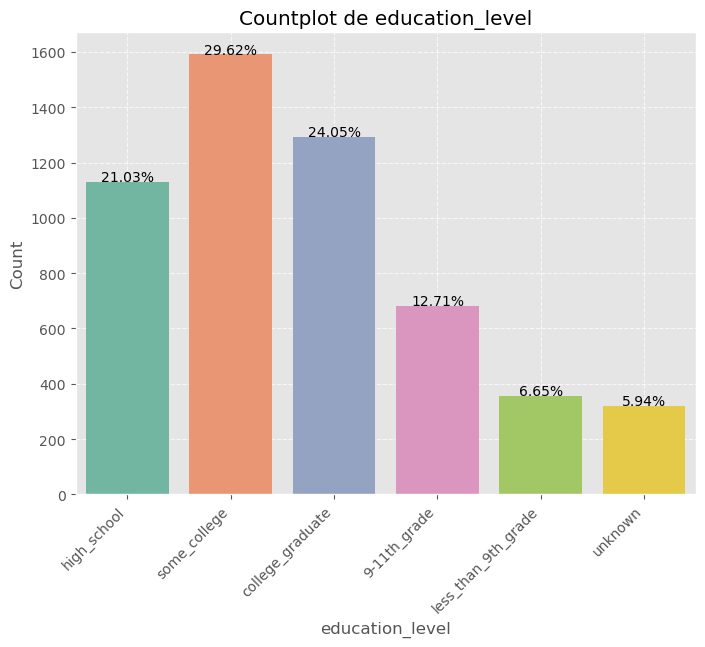

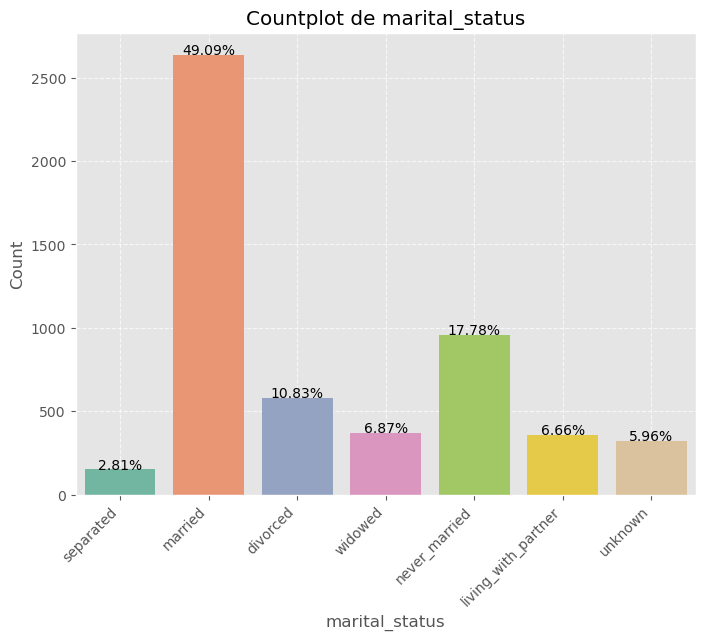

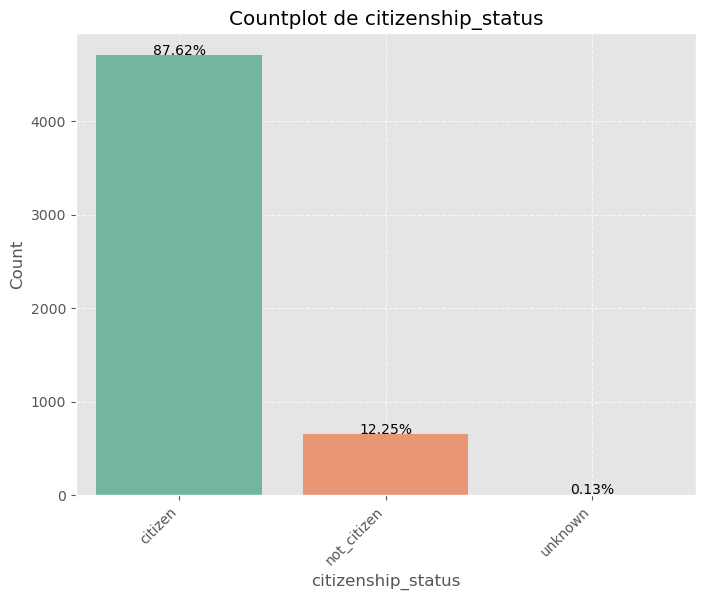

...

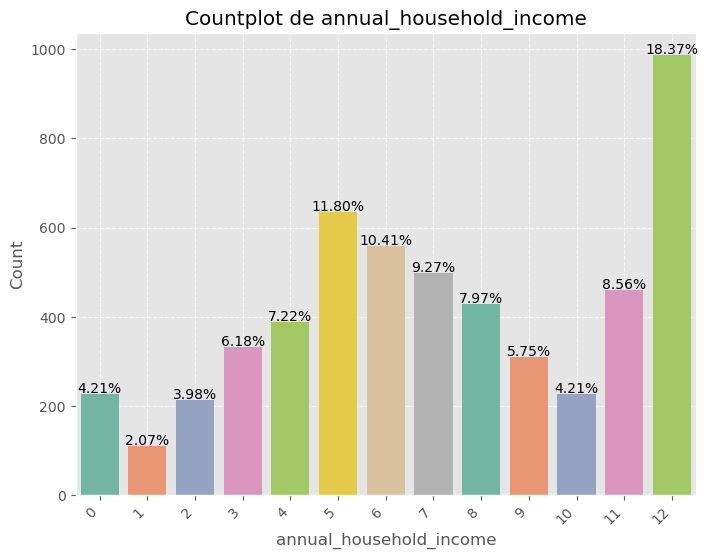

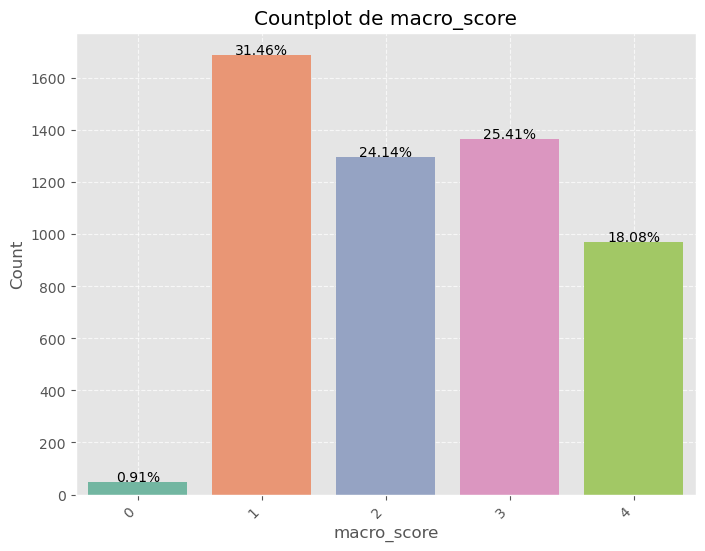

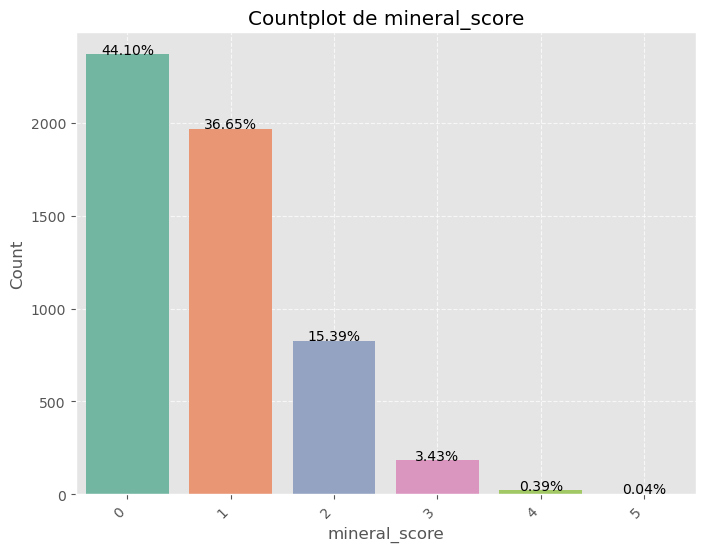

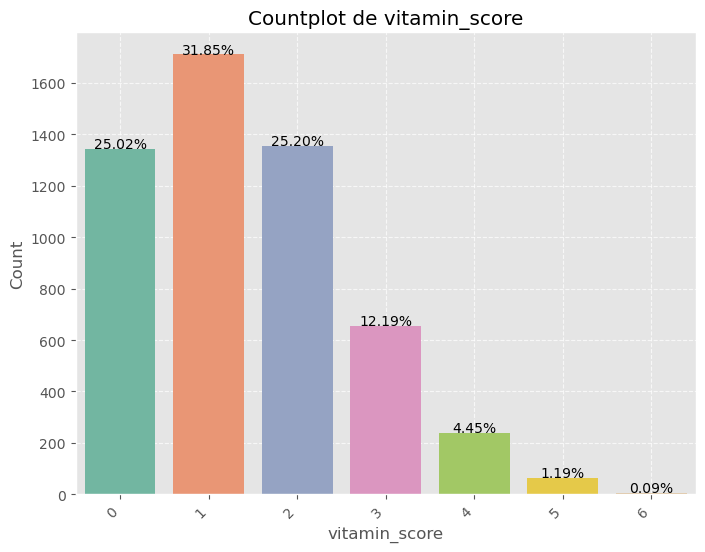

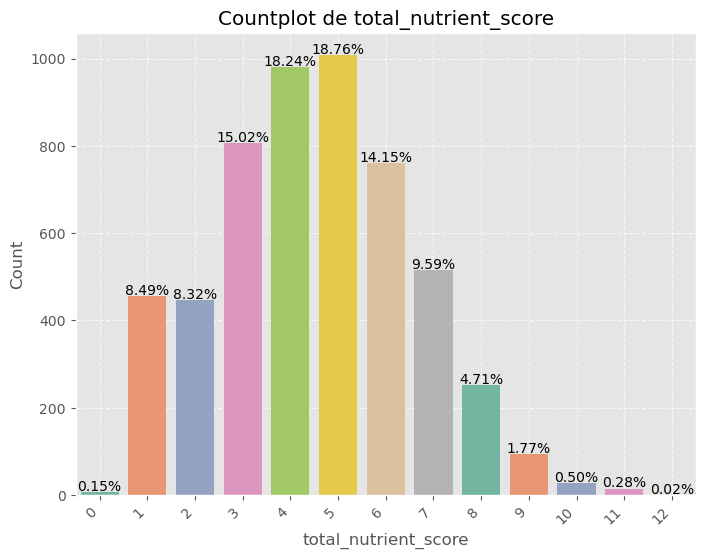

In [5]:
plt.style.use('ggplot')

for col in categorical_vars:
    plt.figure(figsize=(8, 6))
    
    # Countplot
    ax = sns.countplot(x=col, data=df, palette='Set2')
    
    # Number of total observations
    total = len(df[col])  
    
    # Percentages in each bar
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2., height + 3,
                f'{height / total:.2%}', ha="center")
    
    plt.title(f'Countplot de {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

Note: The target variable is imbalanced, with a higher count for 'not_depressed' and fewer for 'depressed.'  
During the modeling phase, we will address this imbalance using oversampling techniques as needed.  
Additionally, we will handle categorical variables by applying the one-hot encoding technique.

### Distribution of Numerical Variables<a class="anchor" id="dist_num"></a>

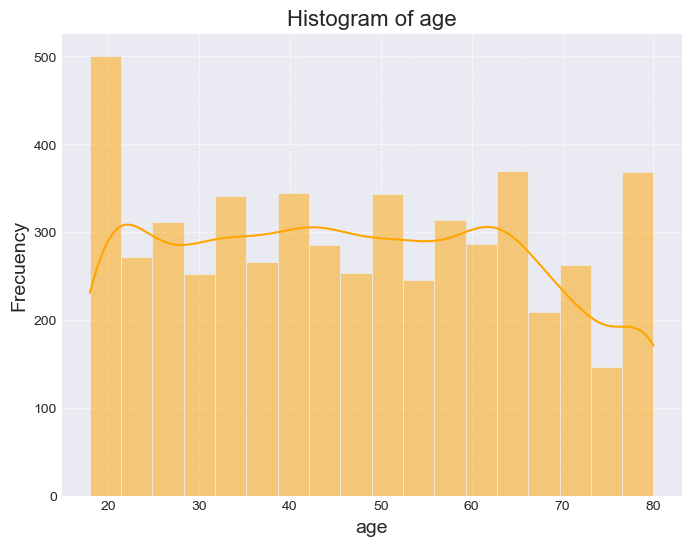

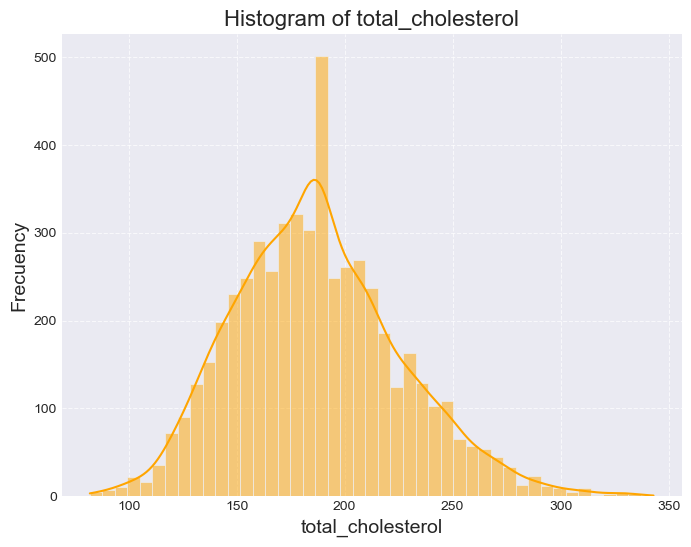

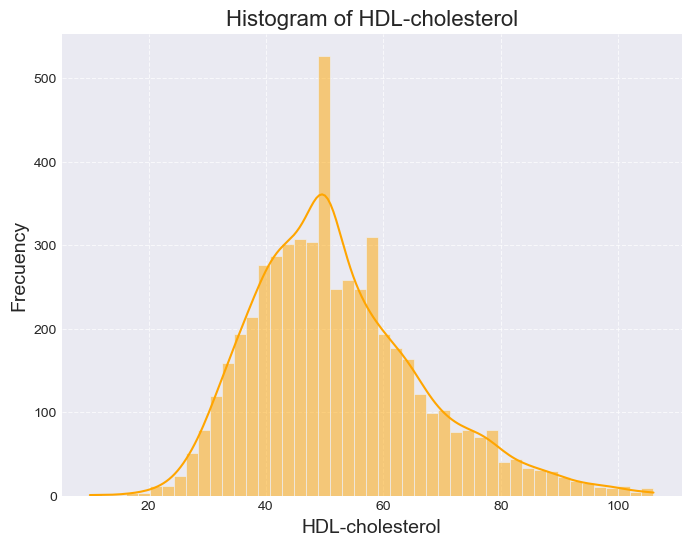

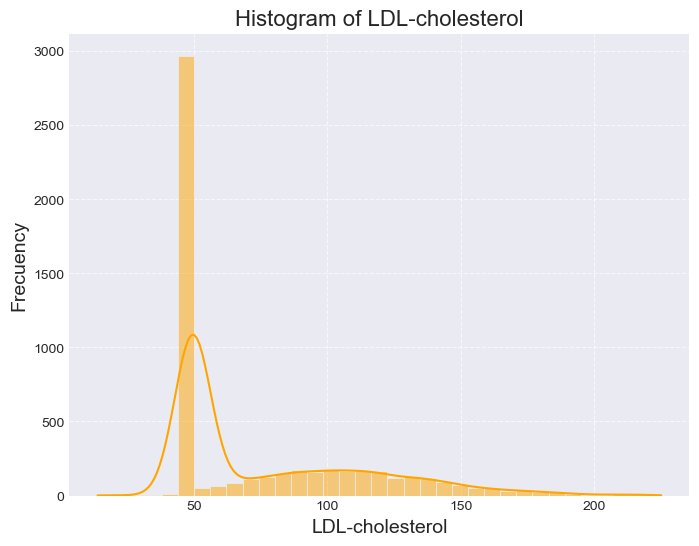

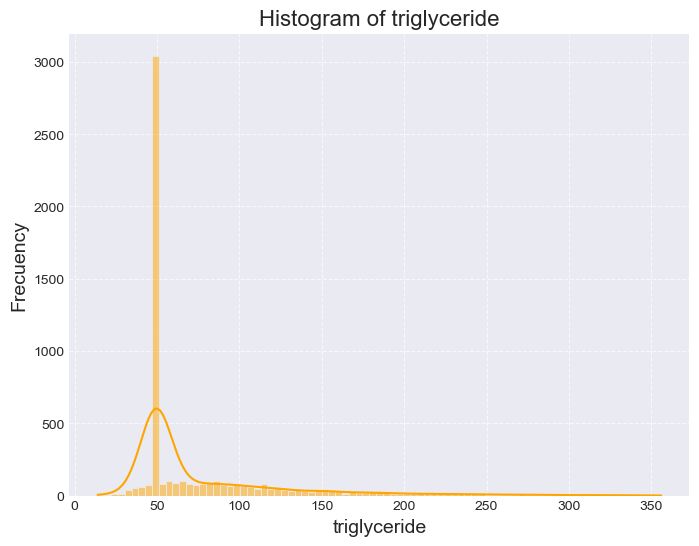

...

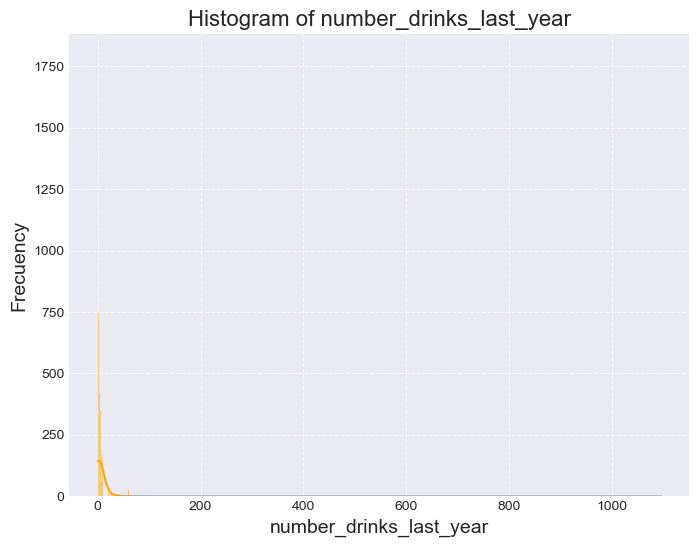

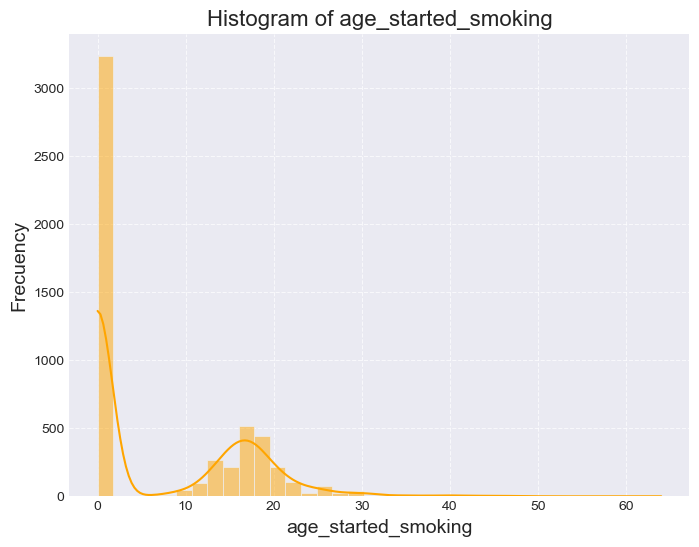

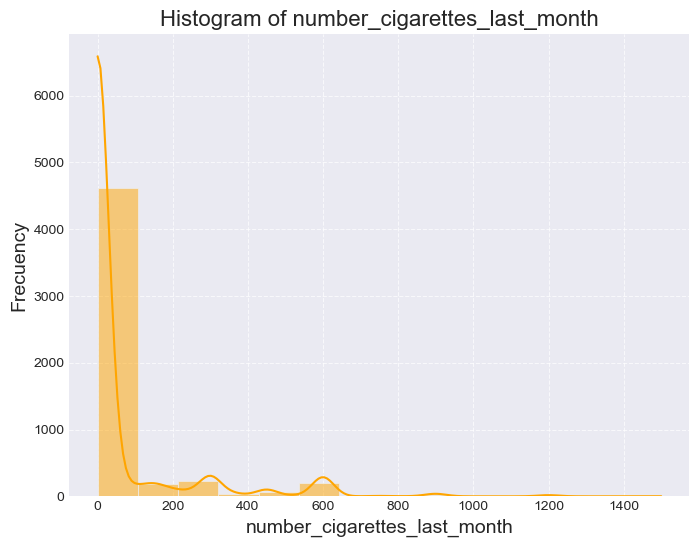

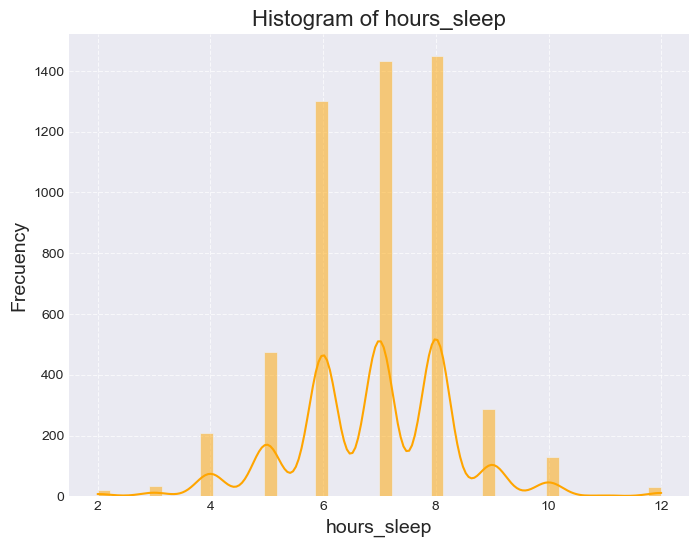

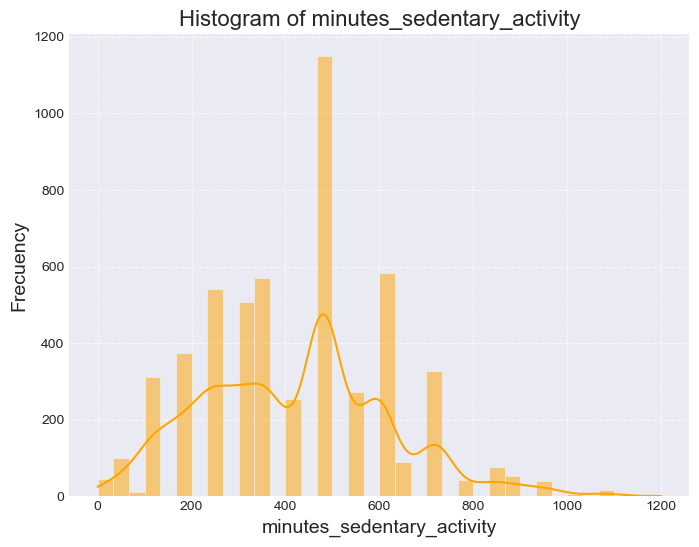

In [8]:
plt.style.use('seaborn-darkgrid')

for col in numerical_vars:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True, color='orange')
    plt.title(f'Histogram of {col}', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Frecuency', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

### Relationship between Numerical Variables and Depression<a class="anchor" id="scatterplot"></a>

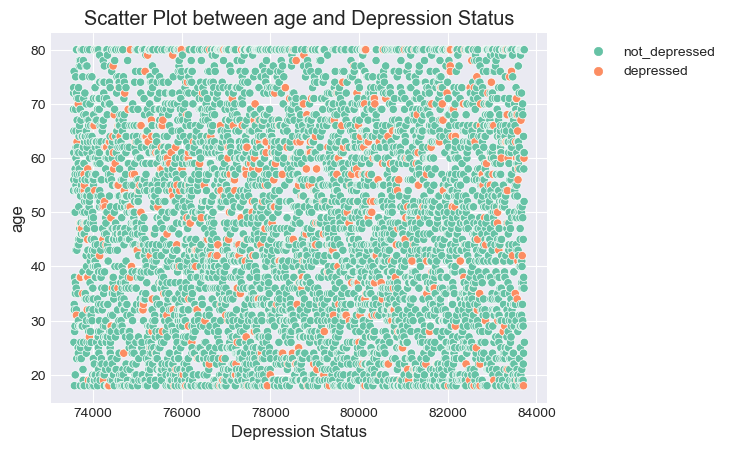

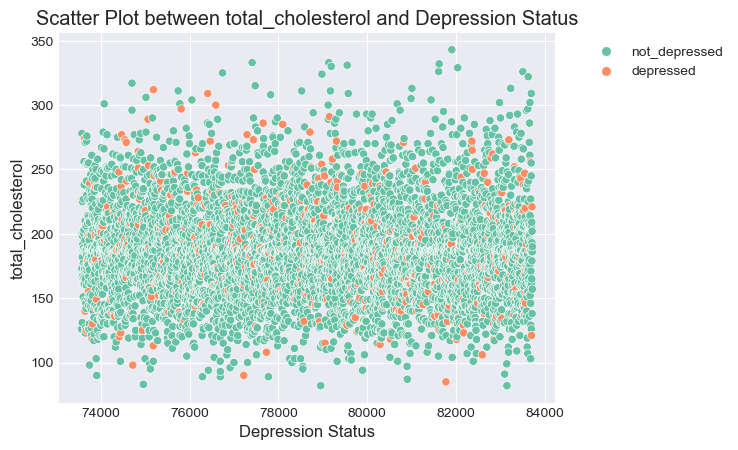

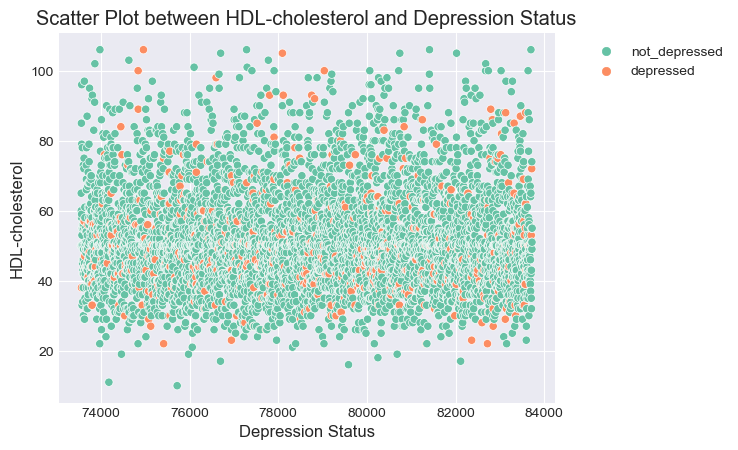

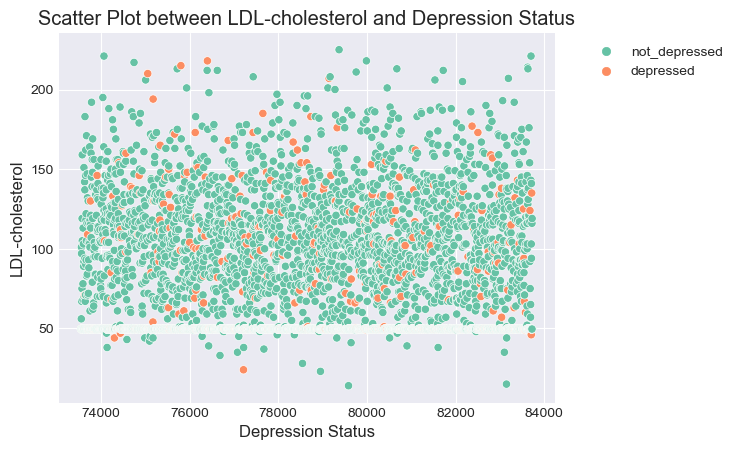

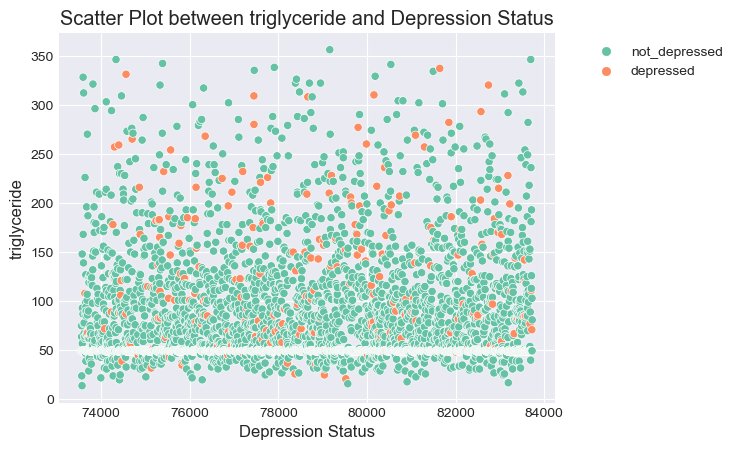

...

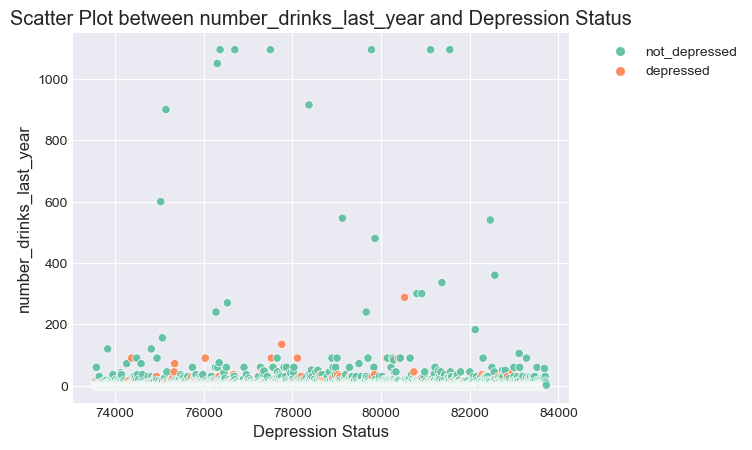

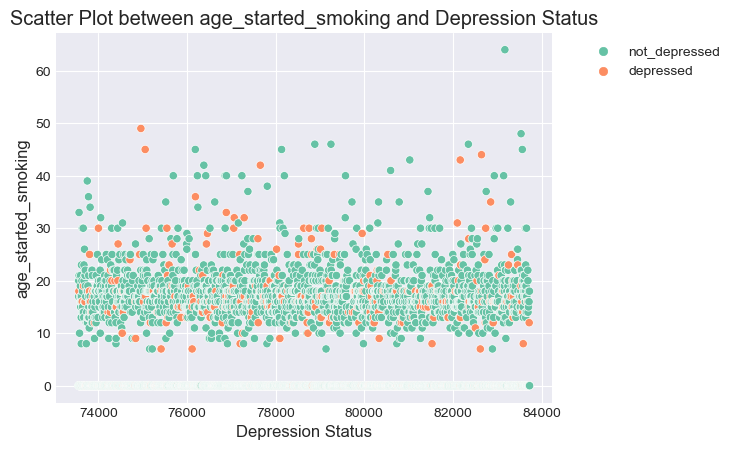

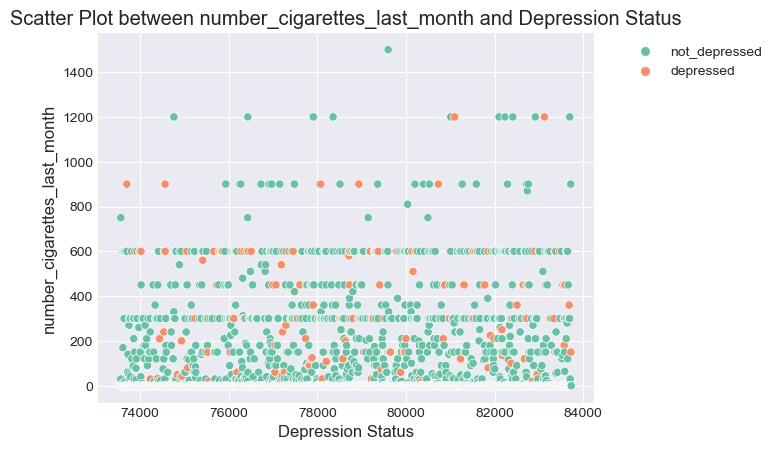

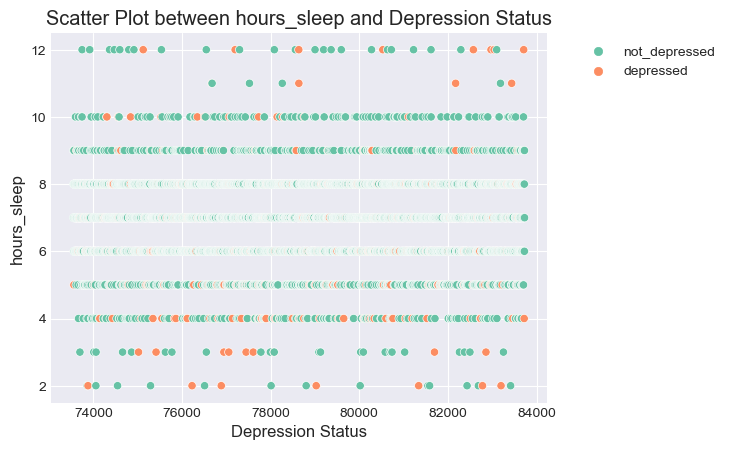

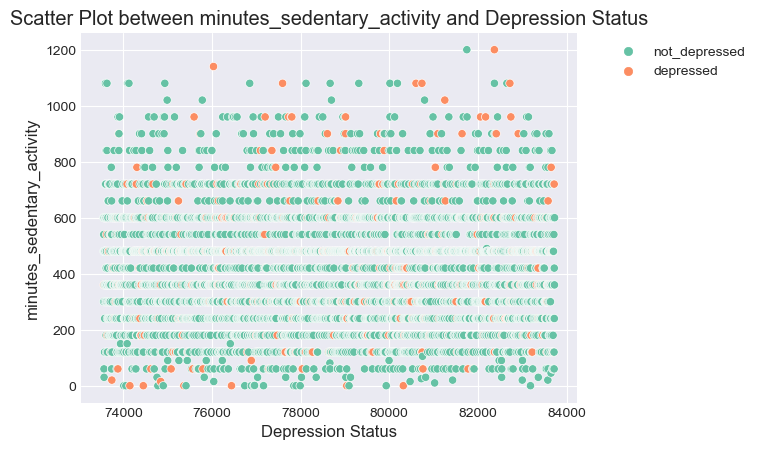

In [9]:
for col in numerical_vars:   
    sns.scatterplot(x=df.index, y=df[col], hue='depression_status', data=df, palette='Set2') 
    plt.title(f'Scatter Plot between {col} and Depression Status')
    plt.xlabel('Depression Status')
    plt.ylabel(f"{col}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

### Relationship between Categorical Variables and Depression<a class="anchor" id="countplot"></a>

<Figure size 800x600 with 0 Axes>

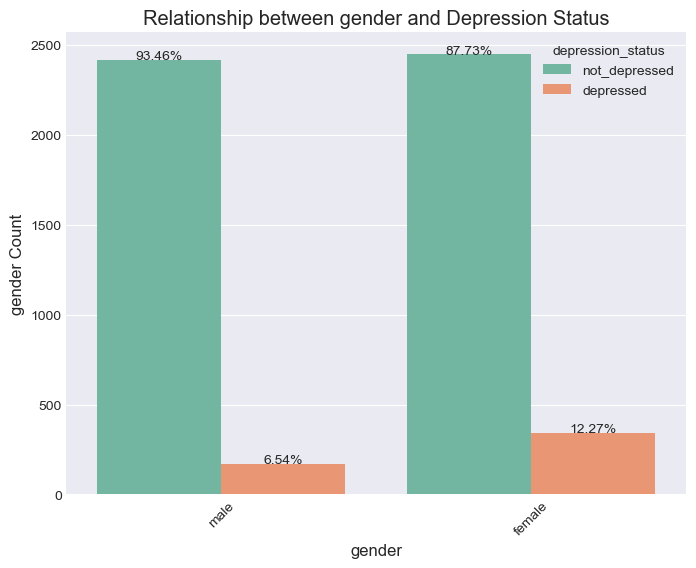

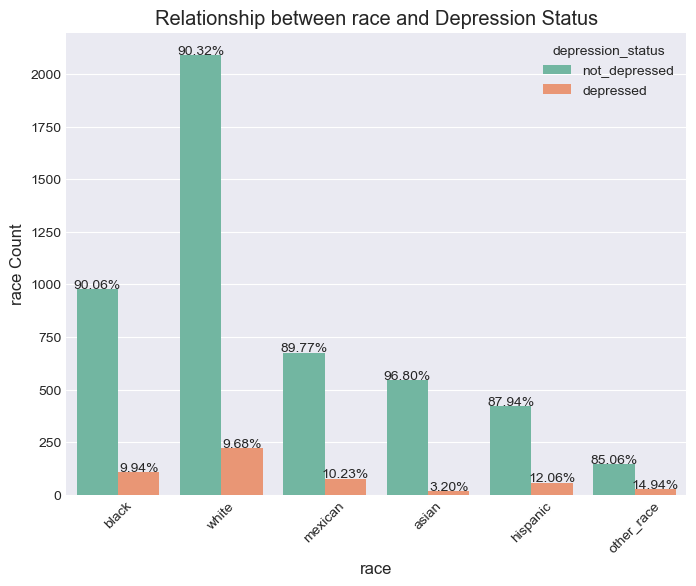

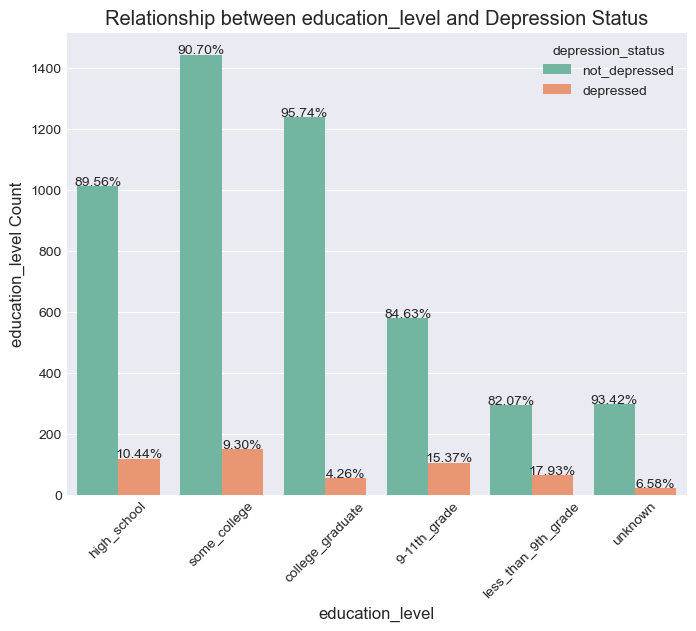

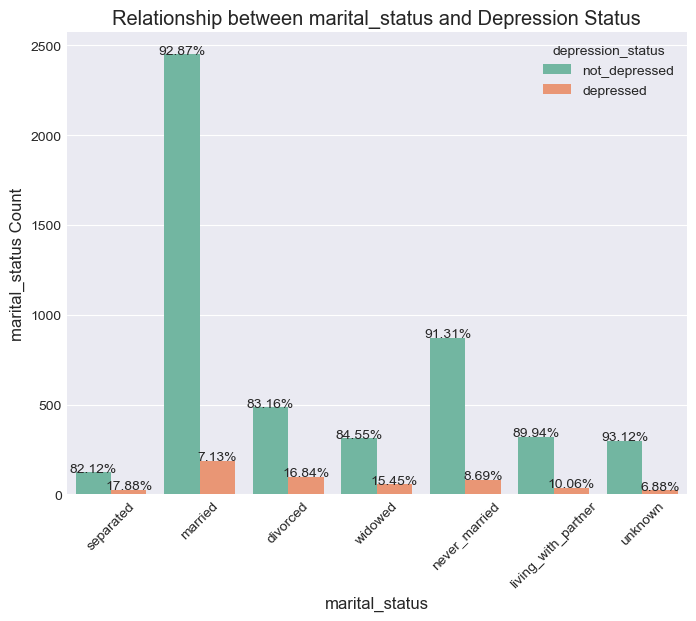

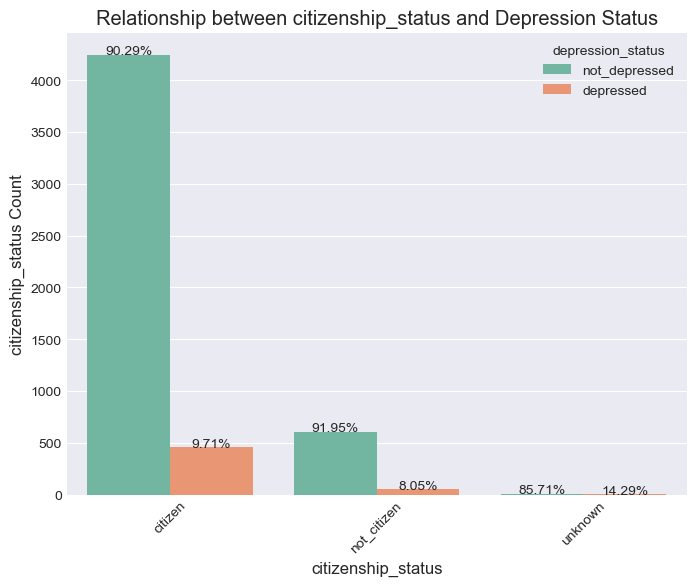

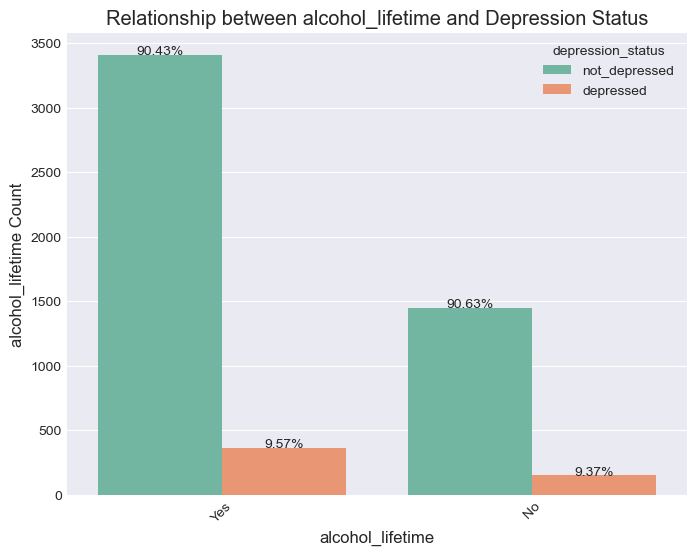

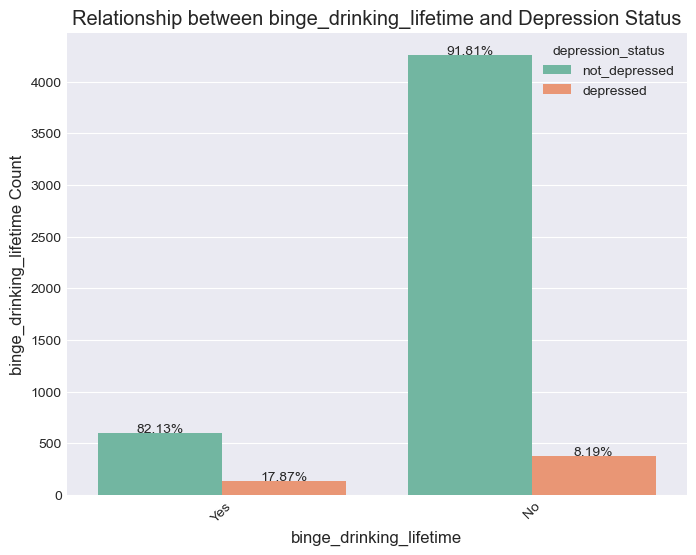

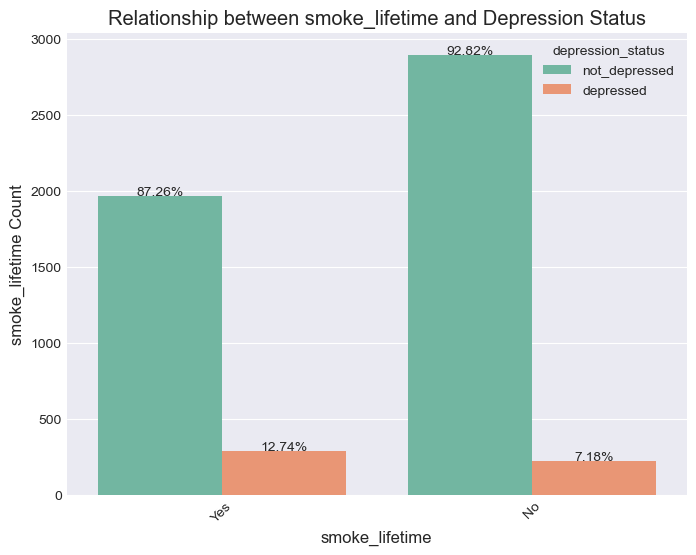

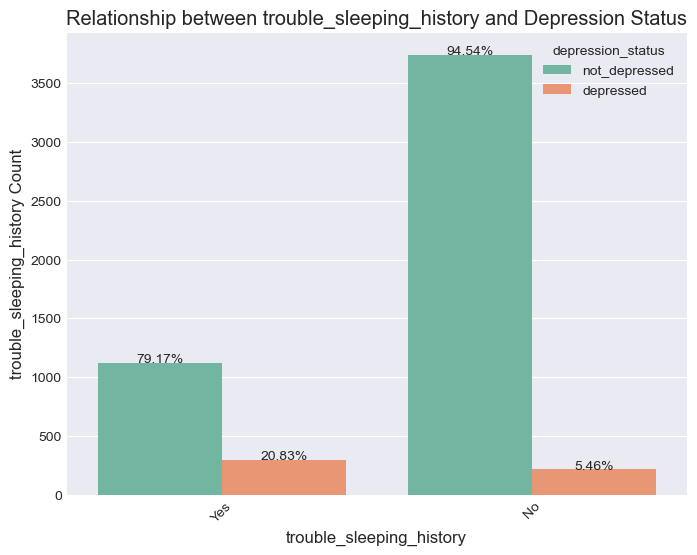

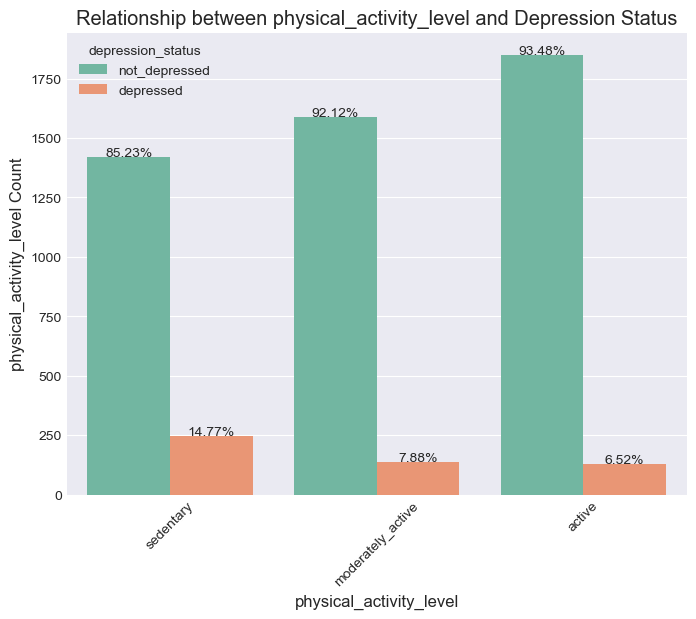

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


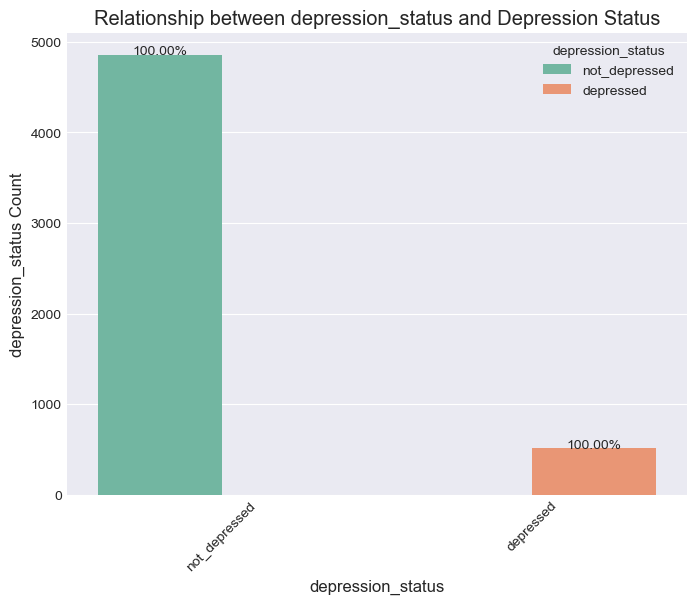

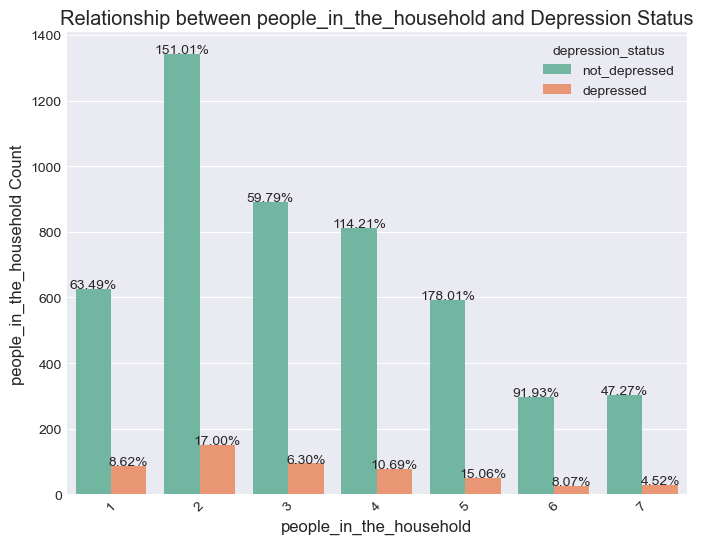

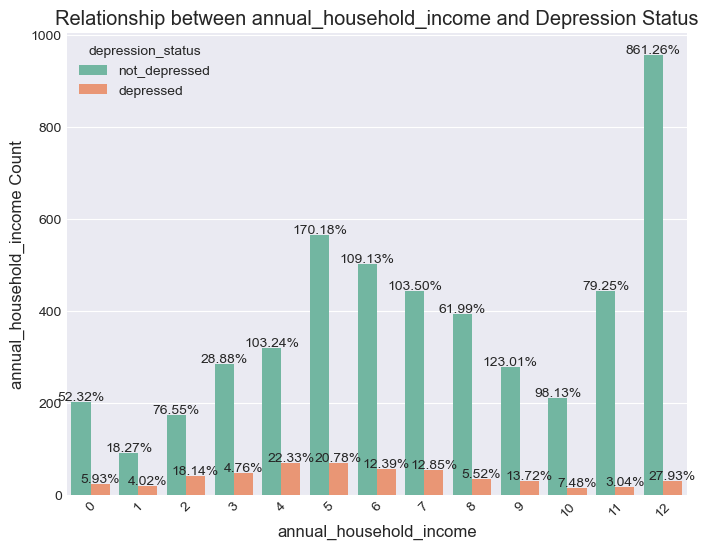

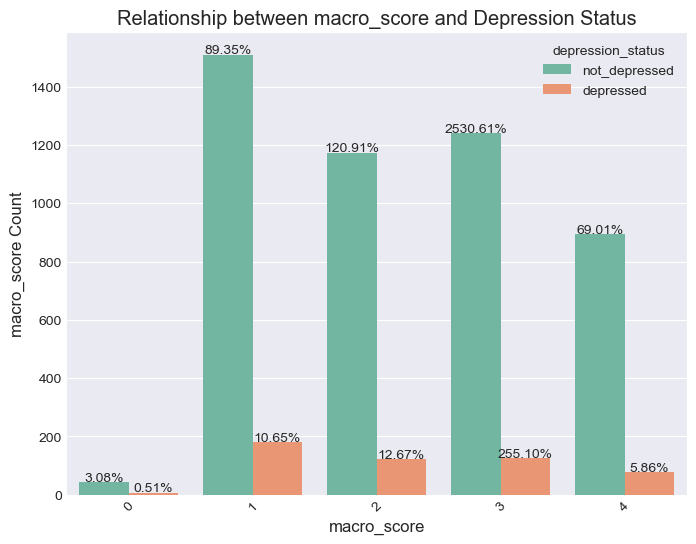

posx and posy should be finite values
posx and posy should be finite values


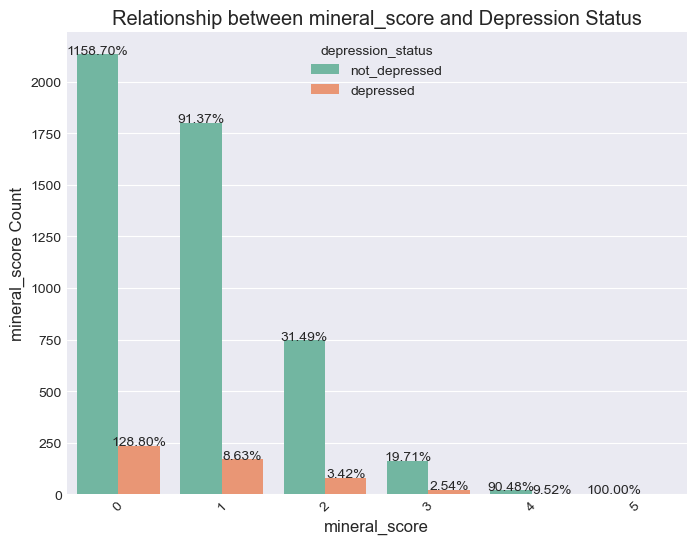

posx and posy should be finite values
posx and posy should be finite values


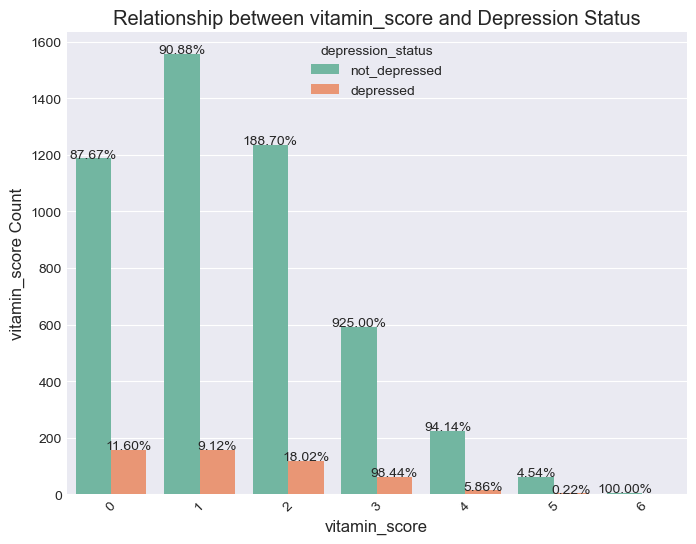

posx and posy should be finite values
posx and posy should be finite values


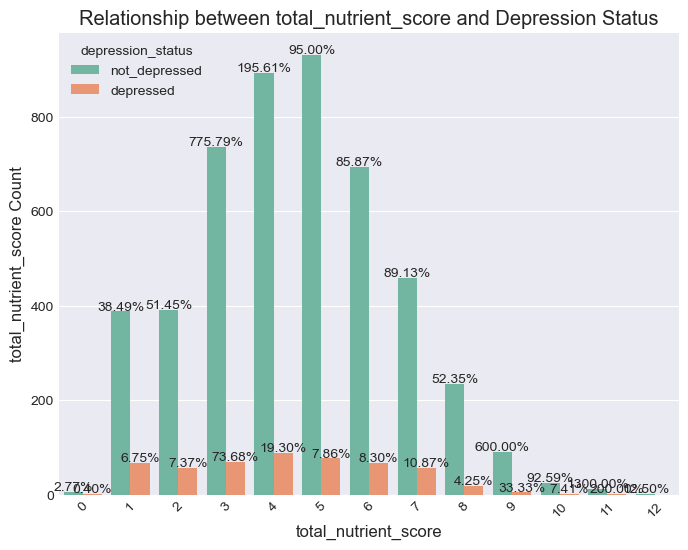

In [10]:
plt.figure(figsize=(8, 6))

for col in categorical_vars:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=col, hue='depression_status', data=df, palette='Set2')
    
    # Total for each category
    category_totals = df[col].value_counts()
    
    for i, p in enumerate(ax.patches):
        height = p.get_height()
        x, hue_index = p.get_x(), i % len(df[col].unique())
        hue = list(df[col].unique())[hue_index]
        
        # Percentage of depression for each category
        percentage_depression = height / category_totals[hue]
        
        # Showing percentage above the bar
        ax.text(x + p.get_width() / 2., height + 3, f'{percentage_depression:.2%}', ha="center")
    
    plt.title(f'Relationship between {col} and Depression Status')
    plt.xlabel(col)
    plt.ylabel(f'{col} Count')
    plt.xticks(rotation=45)
    plt.show()

<Figure size 1000x600 with 0 Axes>

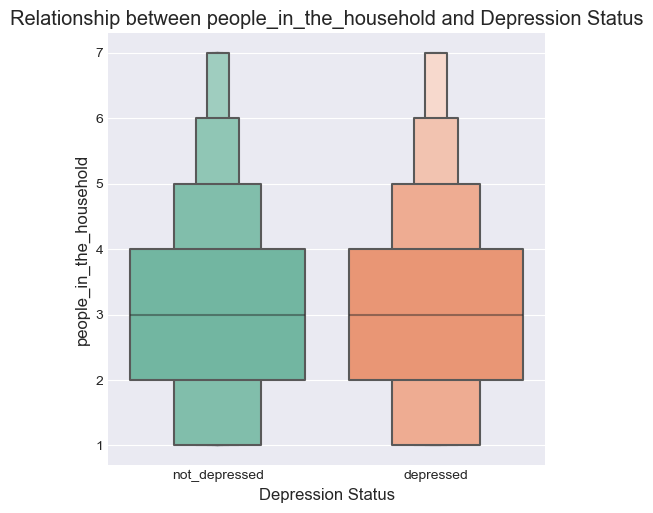

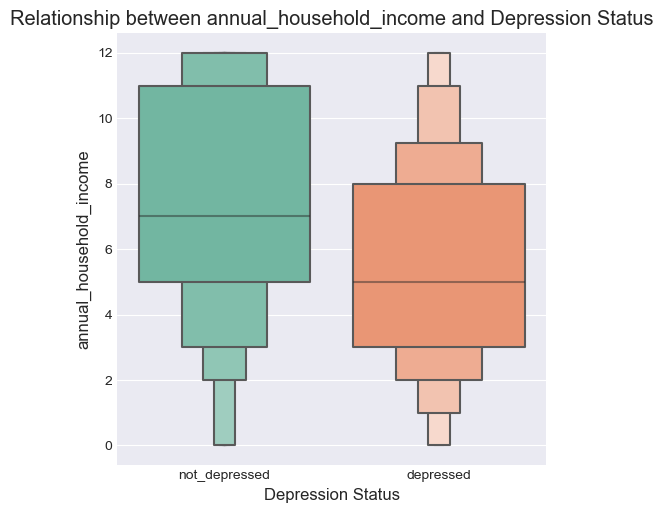

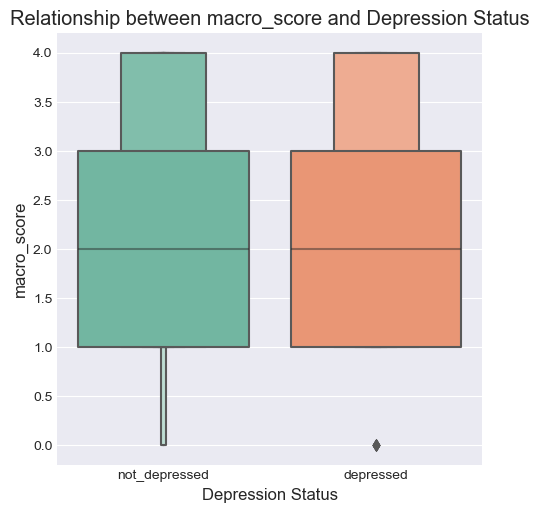

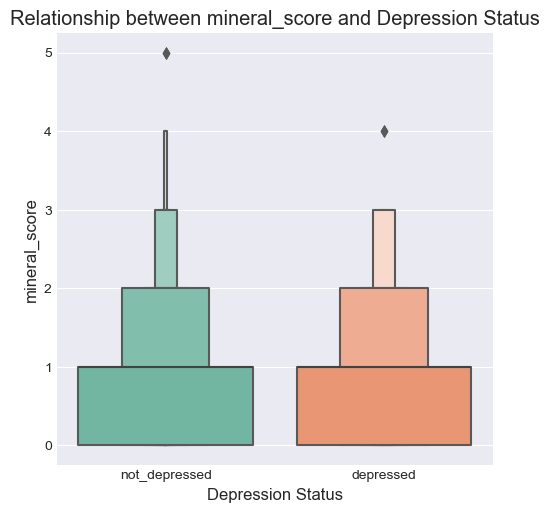

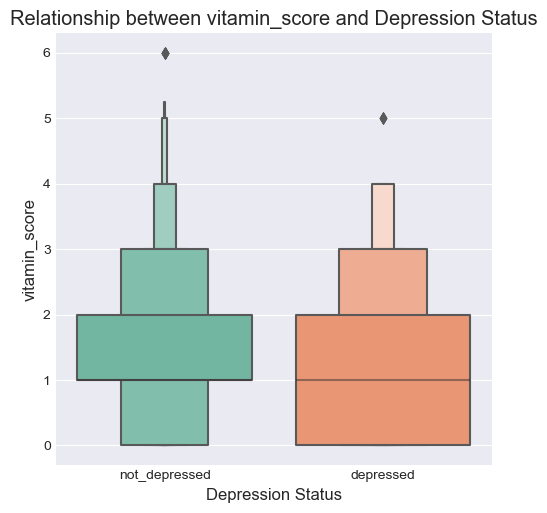

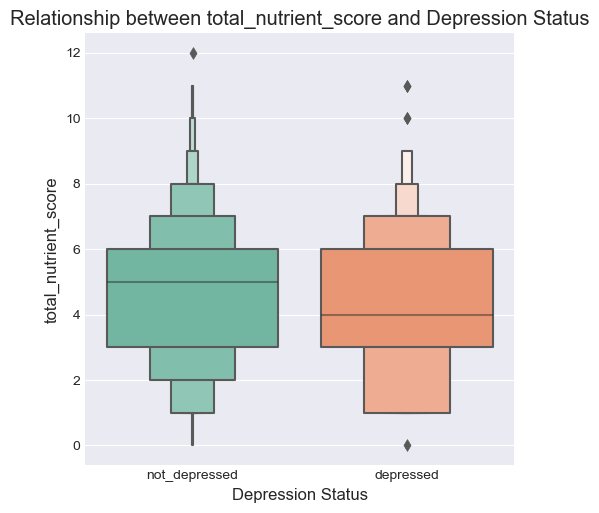

In [11]:
plt.figure(figsize=(10, 6))

for col in cat_num_vars:
    sns.catplot(x='depression_status', y=col, data=df, kind='boxen', palette='Set2')
    plt.title(f'Relationship between {col} and Depression Status')
    plt.xlabel('Depression Status')
    plt.ylabel(col)
    plt.show()

### Correlation Matrix<a class="anchor" id="matrix"></a>

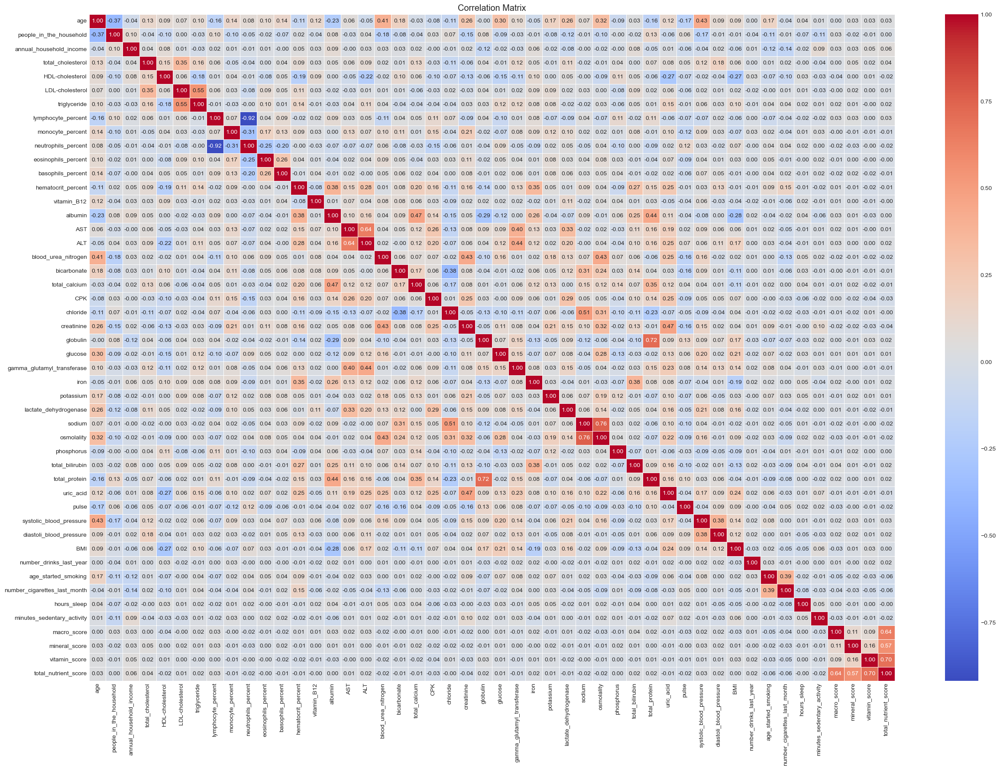

In [12]:
corr_matrix = df.corr()

plt.figure(figsize=(30, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()